# Experiment 1

In [1]:
import os
import tqdm
import pickle
import numpy as np
import networkx as nx

import seaborn as sns
from scipy.stats import beta

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.path as mpath
import matplotlib.collections as mcoll
import matplotlib.animation as animation

from time import time
from scipy.stats import pearsonr
from mpl_toolkits.mplot3d import Axes3D 
from matplotlib.colors import LinearSegmentedColormap

from model_optimized import run_model_n_times
from experiment_utils import get_distribution,get_development_matrix,findIntersection

from plotting_utils import plot_development,plot_neighbors
from plotting_utils import plot_model_summary,plot_network_development_summary,plot_stage_distribution

___

# 1. Initialization

## 0. Seeds

In [2]:
seed_network = 42
seed_numpy = 22

In [3]:
np.random.seed(seed_numpy)

## 1. Model

In [4]:
PLOT = True

Model summary


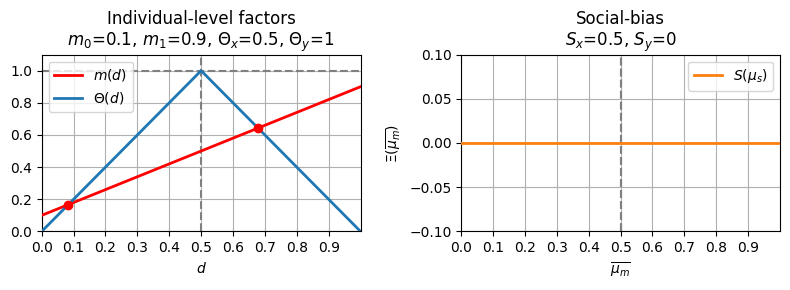

Starting network summary
Egocentric stage length: 0.08333333333333334
Ethnocentric stage length: 0.5952380952380952
Worldcentric stage length: 0.3214285714285714


In [5]:
# 1. Model definition
m0 = 0.1
m1 = 0.9
theta_x = 0.5
theta_y = 1
sx = 1/2 
sy = 0
d12,m12 = findIntersection(0,0,theta_x,theta_y,0,m0,1,m1)
d23,m23 = findIntersection(theta_x,theta_y,1,0,0,m0,1,m1)

model = {
    'm0': m0,
    'm1': m1,
    'theta_x': theta_x,
    'theta_y': theta_y,
    'sx': sx,
    'sy': sy,
    'm12' : m12,
    'm23' : m23
}

assert m0 > 0, "Minimum individual agent morality must be > 0"
assert m1 <= 1, "Maxium individual agent morality must be <= 1"
assert theta_x * (m1-m0) + m0 < theta_y, """
Current global parameter set doesn't allow for 3 stages\n For this, ensure: 
GLOBAL_THETA_X*(GLOBAL_M1-GLOBAL_M0)+GLOBAL_M0 < GLOBAL_THETA_Y"""

# Plot model too
if PLOT:
    print('Model summary')
    plot_model_summary(model=model,points_plotting=1000)
    print('Starting network summary')

    # Print range of stages
    stage_lengths = [d12,d23-d12,1-d23]
    print('Egocentric stage length:',stage_lengths[0])
    print('Ethnocentric stage length:',stage_lengths[1])
    print('Worldcentric stage length:',stage_lengths[2])

## 2. Global parameters

In [6]:
# Model
M = model

# Network nodes
N = 10

# Variances to consider in these Beta distributions
variances = [0.01]

# Number of runs per configuration
R = 30

# Number of timesteps per configuration
T = 300

In [7]:
# Number of hub means
x1_size = 20

# Number of periphery means
x2_size = 20

## 3. Networks
Topology of population, defining the bonds among them

In [9]:
# Create the different network topologies
network_topologies = {}

In [10]:
###############
# BA networks #
###############
network = nx.barabasi_albert_graph(n=N, m=int(N-1),seed=seed_network)
network_BA = nx.to_numpy_array(network)

# Add the networks to the dictionary
network_topologies['BA'] = network_BA

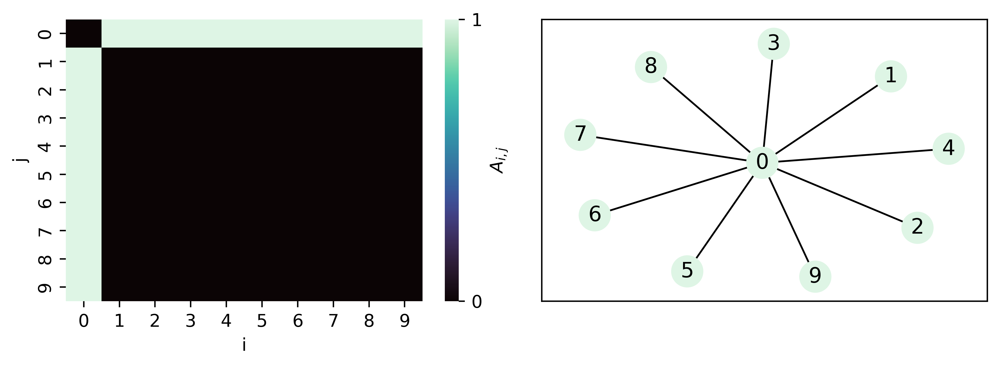

In [65]:
# Desired DPI for plot
dpi = 500

# Create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,3),dpi=dpi)

# Left plot

labels = network_BA.astype(str)

for i in range(len(labels)):
    for j in range(len(labels[i])):
        if labels[i][j] == '0.0' or labels[i][j] == '1.0':
            labels[i][j] = ''
        else:
            labels[i][j] = labels[i][j][2:].lstrip("0")


cmap = "mako"
camp_full = sns.color_palette(cmap, as_cmap=True)
#ax1.set_title('Adjacency matrix')
sns.heatmap(network_BA, cmap=cmap, annot=labels, annot_kws={'fontsize': 8}, fmt='s', ax=ax1,cbar_kws={"ticks": [0, 1],"label":'$A_{i,j}$'})

ax1.set_xlabel('i')
ax1.set_ylabel('j')

# Right plot
pos = nx.spring_layout(network)

node_c = camp_full(1000)
node_color = node_c #(node_c,node_c,node_c)
node_colors = [node_color for i in range(N)]
nx.draw_networkx(network, ax=ax2, pos=pos, with_labels=True, node_color=node_colors)

plt.tight_layout()

plt.savefig('./EXP1/topology.jpg', dpi=dpi)

## 4. Development
Initial distribution of moral development in population

In [68]:
# Tolerance for fitting the actual development distribution to theoretical one indicated
tolerance = 1e-6 

mean_min = 0.1
mean_max = 0.9

development_means = np.linspace(mean_min,mean_max,x1_size) # Periphery means
development_variances = variances[0]*np.ones(x1_size)

development_hub = np.linspace(mean_min,mean_max,x2_size) 
development_periphery = np.zeros((x1_size,N)) 

# To keep track of Beta distribution parameters used
alphas = np.zeros(x1_size)
betas  = np.zeros(x1_size)

for d in range(x1_size):

    # Get Beta distribution parameters
    distribution_parameters = get_distribution(development_means[d],development_variances[d],tolerance)
    alphas[d] = distribution_parameters['alpha']
    betas[d] = distribution_parameters['beta']

    # Save the developmental matrix of each
    development_periphery[d,:] =  get_development_matrix(distribution_parameters,N)
    
# Print stuff
print('development_means')
print(development_means)
print('development_variances')
print(development_variances)
print('alphas')
print(alphas)
print('betas')
print(betas)

development_means
[0.1        0.14210526 0.18421053 0.22631579 0.26842105 0.31052632
 0.35263158 0.39473684 0.43684211 0.47894737 0.52105263 0.56315789
 0.60526316 0.64736842 0.68947368 0.73157895 0.77368421 0.81578947
 0.85789474 0.9       ]
development_variances
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01]
alphas
[ 0.8         1.59031929  2.58405015  3.73640472  5.00259513  6.3378335
  7.69733197  9.03630267 10.30995772 11.47350926 12.48216941 13.29115031
 13.85566409 14.13092288 14.0721388  13.63452398 12.77329057 11.44365068
  9.60081645  7.2       ]
betas
[ 7.2         9.60081645 11.44365068 12.77329057 13.63452398 14.0721388
 14.13092288 13.85566409 13.29115031 12.48216941 11.47350926 10.30995772
  9.03630267  7.69733197  6.3378335   5.00259513  3.73640472  2.58405015
  1.59031929  0.8       ]


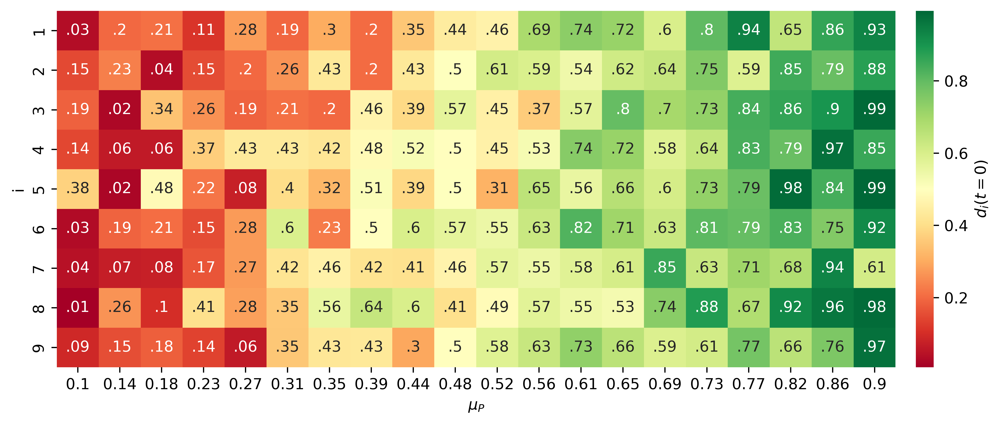

In [136]:
# Plot periphery development and variance?
dpi = 550

plt.figure(figsize=(10,4),dpi=dpi)
labels = np.round(development_periphery[:,1:].T, decimals=2).astype(str)

for i in range(len(labels)):
    for j in range(len(labels[i])):
        labels[i][j] = labels[i][j].lstrip("0")

cmap = 'RdYlGn'
sns.heatmap(development_periphery[:,1:].T, cmap=cmap, annot=labels, annot_kws={'fontsize': 10}, fmt='s',cbar_kws={"ticks": [0, 0.2,0.4,0.6,0.8,1], "label": "$d_i(t=0)$",'pad':0.02,'ticks': [0, 0.2,0.4,0.6,0.8, 1]})

# Update xticks
x_ticks = plt.xticks()[0]
new_x_ticks = np.round(development_means,decimals=2)
plt.xticks(x_ticks, new_x_ticks)

# Update yticks
y_ticks = plt.yticks()[0]
new_y_ticks = list(np.arange(1, N))
plt.yticks(y_ticks, new_y_ticks)

# Axis labels
plt.xlabel('$\mu_P$')
plt.ylabel('i')

plt.tight_layout()
plt.savefig('./EXP1/periphery.jpg', dpi=dpi)

In [102]:
string_hub = [i.lstrip("0") for i in np.round(development_hub, decimals=2).astype(str)]
string_hub

['.1',
 '.14',
 '.18',
 '.23',
 '.27',
 '.31',
 '.35',
 '.39',
 '.44',
 '.48',
 '.52',
 '.56',
 '.61',
 '.65',
 '.69',
 '.73',
 '.77',
 '.82',
 '.86',
 '.9']

In [103]:
np.round(development_hub, decimals=2)

array([0.1 , 0.14, 0.18, 0.23, 0.27, 0.31, 0.35, 0.39, 0.44, 0.48, 0.52,
       0.56, 0.61, 0.65, 0.69, 0.73, 0.77, 0.82, 0.86, 0.9 ])

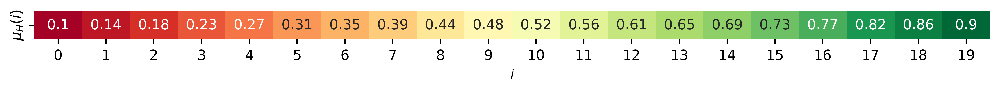

In [98]:
# Same plot for HUB
import pandas as pd

plt.figure(figsize=(10,1),dpi=dpi)
data = np.round(development_hub, decimals=2)

df = pd.DataFrame(data)
some =sns.heatmap(df.T, annot=True, fmt="g", cmap=cmap, annot_kws={'fontsize': 10}, cbar=False)

plt.xlabel('$i$')
plt.yticks([0.5],['$\mu_H(i)$'])

plt.tight_layout()
plt.savefig('./EXP1/hub.jpg', dpi=dpi)

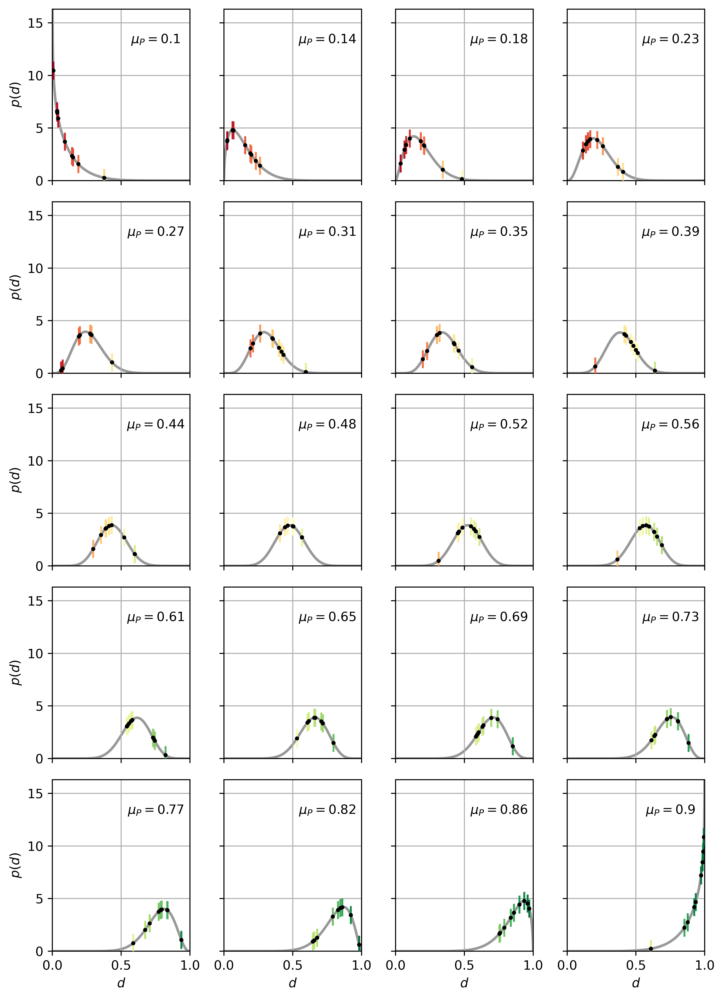

In [116]:
# Plot the specific Beta distributions and their sampled values
# Define the number of rows and columns in the subplot grid
dpi = 550
num_rows = 5
num_cols = 4

# Create a figure with subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(8, 11),sharex=True,sharey=True,dpi=dpi)

# Loop through the x1_size
for i in range(x1_size):
    # Retrieve alpha and beta values
    current_a = alphas[i]
    current_b = betas[i]

    # Plot Beta distribution on the current subplot
    x = np.linspace(0.0001,0.9999,1000)
    y = beta.pdf(x,current_a,current_b)
    axs.flat[i].plot(x, y,c='grey', lw=2, alpha=0.8,label=f'$\mu={round(development_means[i],2)}$',zorder=1)

    # Scatter sampled points on the current subplot
    x_points = development_periphery[i,1:]
    y_points = beta.pdf(x_points,current_a,current_b)
    c_points = plt.cm.RdYlGn(x_points)
    axs.flat[i].scatter(x_points,y_points,c=c_points,marker="|",s=200,zorder=20)
    axs.flat[i].scatter(x_points,y_points,c='black',marker=".",s=20,zorder=21)
    
    # Set title and labels for the current subplot
    axs.flat[i].set_xlim([0,1])
    axs.flat[i].set_ylim([0,16.3])
    axs.flat[i].grid()
    axs.flat[i].text(0.75, 14, f'$\mu_P = {round(development_means[i],2)}$', ha='center', va='top', fontsize=10)

    if i in [0,4,8,12,16]:
        axs.flat[i].set_ylabel('$p(d)$')

    if i in [16,17,18,19]:
        axs.flat[i].set_xlabel('$d$')

# Show the plot
plt.tight_layout()
plt.savefig('./EXP1/periphery_distributions.jpg', dpi=dpi)

___

In [39]:
mean_diferences_max

np.float64(0.059633216587077986)

## 4. Save inputs

### 1. Gather all input data

In [23]:
# Parameters
parameters = {}
parameters['seed_network'] = seed_network
parameters['seed_numpy'] = seed_numpy

parameters['N'] = N
parameters['R'] = R
parameters['T'] = T

parameters['x1_size'] = x1_size # Number of hub means
parameters['x2_size'] = x2_size # Number of periphery means

parameters['variances'] = variances

parameters['mean_min'] = mean_min
parameters['mean_max'] = mean_max

parameters['development_means'] = development_means
parameters['development_variances'] = development_variances

parameters['development_hub'] = development_hub
parameters['development_periphery'] = development_periphery

parameters['beta_tol'] = tolerance
parameters['beta_alphas'] = alphas
parameters['beta_betas'] = betas

parameters['mean_diferences'] = mean_diferences
parameters['mean_diferences_abs'] = mean_diferences_abs
parameters['mean_diferences_max'] = mean_diferences_max

# Model, topologies and distributions already in dict
# model, network_topologies, initial_distribution

### 1. Create realization folder

In [24]:
experiment_root_folder = 'EXP1'

# Create root folder if not present already
if not os.path.exists(experiment_root_folder):
        os.makedirs(experiment_root_folder)

def get_next_folder_name(folder_path):
    # Get a list of all folders
    folder_list = [int(x) for x in os.listdir(experiment_root_folder) if x.isdigit()]
    folder_list.sort()
    next_folder_name = str(len(folder_list))

    while os.path.exists(os.path.join(folder_path, next_folder_name)):
        next_folder_name = str(int(next_folder_name) + 1)

    return next_folder_name

# Get folder name for this realization
realization_folder_name = get_next_folder_name(experiment_root_folder)

# Get path for the data of this realization
realization_path = f"./{experiment_root_folder}/{realization_folder_name}"

if not os.path.exists(realization_path):
        os.makedirs(realization_path)

### 3. Save inputs

In [25]:
print('Saving in',realization_folder_name)

Saving in 4


In [26]:
# Create input folder
input_path = realization_path +'/' + 'inputs'

# Create root folder if not present already
if not os.path.exists(input_path):
        os.makedirs(input_path)

In [27]:
# Parameters
with open(input_path+'/parameters.pickle', 'wb') as h:
    pickle.dump(parameters, h, protocol=pickle.HIGHEST_PROTOCOL)

# Model
with open(input_path+'/model.pickle', 'wb') as h:
    pickle.dump(model, h, protocol=pickle.HIGHEST_PROTOCOL)

# Network topologies
with open(input_path+'/network_topologies.pickle', 'wb') as h:
    pickle.dump(network_topologies, h, protocol=pickle.HIGHEST_PROTOCOL)

___

# 2. Simulation

### 1. Load inputs

In [8]:
realization_folder_name = '4'
experiment_root_folder = 'EXP1'

realization_path = f"./{experiment_root_folder}/{realization_folder_name}"
input_path = realization_path +'/' + 'inputs'

In [9]:
# Parameters
with open(input_path+'/parameters.pickle', 'rb') as h:
    parameters = pickle.load(h)

    seed_network = parameters['seed_network']
    seed_numpy = parameters['seed_numpy']

    N = parameters['N'] 
    R = parameters['R']
    T = parameters['T']

    x1_size = parameters['x1_size']  # Number of hub means
    x2_size = parameters['x2_size']  # Number of periphery means

    variances = parameters['variances']

    mean_min = parameters['mean_min'] 
    mean_max = parameters['mean_max']

    development_means = parameters['development_means']
    development_variances = parameters['development_variances']

    development_hub = parameters['development_hub']
    development_periphery = parameters['development_periphery']

    tolerance = parameters['beta_tol']
    alphas = parameters['beta_alphas']
    betas = parameters['beta_betas']

    mean_diferences = parameters['mean_diferences'] 
    mean_diferences_abs = parameters['mean_diferences_abs']  
    mean_diferences_max = parameters['mean_diferences_max'] 

# Model
with open(input_path+'/model.pickle', 'rb') as h:
    model = pickle.load(h)

# Network topologies
with open(input_path+'/network_topologies.pickle', 'rb') as h:
    network_topologies = pickle.load(h)

### 2. Create results folder

In [35]:
# Create results folder
results_path = realization_path +'/' + 'results'

# Create results folder if not present already
if not os.path.exists(results_path):
        os.makedirs(results_path)
else:
        print('Folder already exists!')

## 3. Run model

Iterate for all types within the experiment.

Indexing is done by:
1. Topology = ['ER'.'BA','WS']
2. Distribution = ['Beta_v0.01', 'Beta_v0.02', 'Beta_v0.03', 'Beta_v0.04'])
3. Connectivity = [0,1,2]  - [0,...,N_networks]
4. Average = [0,1,2]  - [0,...,N_distribs]


In [36]:
results_path = realization_path +'/' + 'results'

In [37]:
results_path

'./EXP1/4/results'

In [38]:
# Logging: For printing progress
n_combinations = x1_size*x2_size
counter = 1

# Retrieve the topology
network = network_topologies['BA'][:,:]

# Iterate for all hub and periphery developments
# Logging: print current element and create a progress bar
print(f"{counter}/{n_combinations}")
pbar = tqdm.tqdm(total=x1_size * x2_size)  

# i iterates HUB, j iterates PERIPHERY
for i in range(x1_size):    
    for j in range(x2_size):

        # Retrieve current sub-distribution
        d_hub = development_hub[i]
        d_per = development_periphery[j,1:]
        
        development = np.zeros(N)
        development[0] = d_hub
        development[1:] = d_per

        # Run model
        result = run_model_n_times(runs=R,
                                    timesteps=T,
                                    model=model,
                                    network=network,
                                    development=development)

        # Get result filepath
        result_filename = f'{i}_{j}.pickle'
        result_path = results_path + '/' + result_filename

        # Save result to disk
        with open(result_path, 'wb') as h:
            pickle.dump(result, h, protocol=pickle.HIGHEST_PROTOCOL)

        # Logging: Update the progress bar
        pbar.update(1)  

# Logging: Close the progress bar and update the counter
pbar.close()  
counter += 1

1/400


100%|██████████| 400/400 [20:46<00:00,  3.12s/it]


___

## Plots

In [122]:
# LOADING DATA
realization_folder_name = '4'
experiment_root_folder = 'EXP1'

realization_path = f"./{experiment_root_folder}/{realization_folder_name}"
results_path = realization_path +'/' + 'results'

### PLOT 1: TIME EV GLOBAL

/tmp/ipykernel_1062/1028529864.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


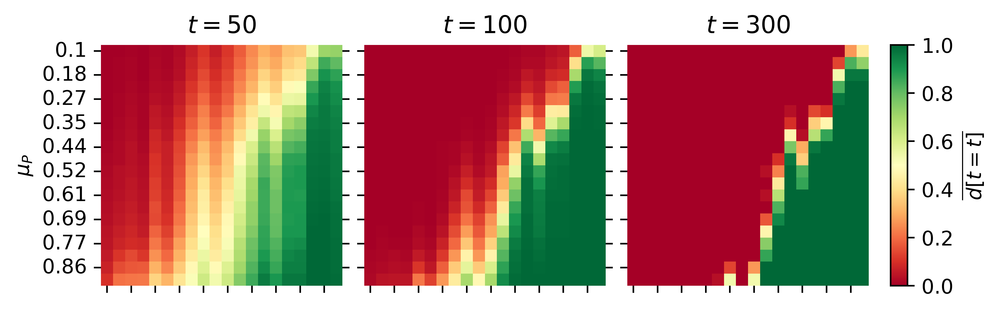

In [241]:
from mpl_toolkits.axes_grid1 import ImageGrid
import matplotlib.cm

dpi = 550
fig = plt.figure(figsize=(7, 3),dpi=dpi)

grid = ImageGrid(fig, 111,          # as in plt.subplot(111)
                 nrows_ncols=(1,3),
                 axes_pad=0.15,
                 share_all=True,
                 cbar_location="right",
                 cbar_mode="single",
                 cbar_size="7%",
                 cbar_pad=0.15,
                 )

# Add data to image grid
k = 0
for ax in grid:

    # Top row: Development
    ax.set_title(f'$t={times[k]+1}$')

    data = values_m[k,:,:]
    labels = np.round(data, decimals=2).astype(str)
    for i in range(len(labels)):
        for j in range(len(labels[i])):
            labels[i][j] = labels[i][j].replace('0.','')
            if labels[i][j] == '0':
                labels[i][j] = ''
            if labels[i][j] == '1.0':
                labels[i][j] = '' 
            labels[i][j] = labels[i][j].lstrip("0")

    cmap = 'RdYlGn' # 'rocket' #
    this_plot = sns.heatmap(data, fmt='s',ax=ax,vmin=0,vmax=1,cbar=False,cmap=cmap)

    # Dummy data to have a colorbar in the end
    im = ax.imshow(np.random.random((10,10)), vmin=0, vmax=1,cmap=cmap)

    # Tiks and colorbar
    if k<2:
        ax.tick_params(left=True, bottom=True,right=True)
    else:
        ax.tick_params(left=True, bottom=True,right=False)
        cbar = ax.cax.colorbar(im)
        cbar.set_label('$\overline{d[t=t]}$')
    
    # Axis labels
    ax.set_ylabel('$\mu_P$')
    YTICKS = [ 0.5,  2.5,  4.5,  6.5,  8.5, 10.5, 12.5, 14.5, 16.5, 18.5]  
    labels = np.round(development_means[::2], decimals=2).astype(str)
    ax.set_yticks(YTICKS,labels)
    ax.tick_params(axis='y', labelrotation=0)
    ax.tick_params(labelbottom=False)

    # Update counter
    k += 1

plt.tight_layout()
plt.savefig('./EXP1/RESULT_PLOT1_MDTIME.jpg', dpi=dpi)

In [138]:
development_means

array([0.1       , 0.14210526, 0.18421053, 0.22631579, 0.26842105,
       0.31052632, 0.35263158, 0.39473684, 0.43684211, 0.47894737,
       0.52105263, 0.56315789, 0.60526316, 0.64736842, 0.68947368,
       0.73157895, 0.77368421, 0.81578947, 0.85789474, 0.9       ])

/tmp/ipykernel_1062/2806095289.py:85: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


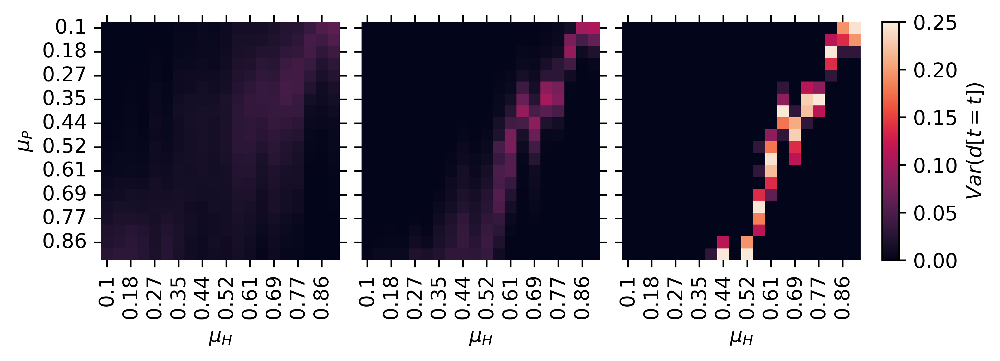

In [200]:
# SAME PLOT BUT VARIANCE
dpi = 550
fig = plt.figure(figsize=(7, 3),dpi=dpi)

grid = ImageGrid(fig, 111,          
                 nrows_ncols=(1,3),
                 axes_pad=0.15,
                 share_all=True,
                 cbar_location="right",
                 cbar_mode="single",
                 cbar_size="7%",
                 cbar_pad=0.15,
                 )

# Add data to image grid
k = 0
for ax in grid:

    data = values_m_V[k,:,:]
    labels = np.round(data, decimals=2).astype(str)
    for i in range(len(labels)):
        for j in range(len(labels[i])):
            labels[i][j] = labels[i][j].replace('0.','')
            if labels[i][j] == '0':
                labels[i][j] = ''
            if labels[i][j] == '1.0':
                labels[i][j] = '' 
            labels[i][j] = labels[i][j].lstrip("0")

    cmap = 'rocket' # 'rocket' #

    this_plot = sns.heatmap(data, fmt='s',ax=ax,vmin=0,vmax=0.25,cbar=False,cmap=cmap)

    # Dummy data to have a colorbar in the end
    im = ax.imshow(np.random.random((10,10)), vmin=0, vmax=0.25,cmap=cmap)

    # Tiks and colorbar
    if k<2:
        ax.tick_params(left=True, bottom=True,right=True,top=True)
    else:
        ax.tick_params(left=True, bottom=True,right=False,top=True)
        cbar = ax.cax.colorbar(im)
        cbar.set_label('$Var(d[t=t])$')
    
    labels = np.round(development_hub[::2], decimals=2).astype(str)
    ax.set_xticks(YTICKS,labels)
    ax.tick_params(axis='x', labelrotation=90)
    ax.set_xlabel('$\mu_H$')

    labels = np.round(development_means[::2], decimals=2).astype(str)
    ax.set_yticks(YTICKS,labels)
    ax.tick_params(axis='y', labelrotation=0)
    ax.set_ylabel('$\mu_P$')
    ax.tick_params(axis='y', labelrotation=0)

    # Update counter
    k += 1

plt.tight_layout()
plt.savefig('./EXP1/RESULT_PLOT1_MDTIME_V.jpg', dpi=dpi)

___

### PLOT 2: HUB PERIPHERY IN CONFIGUTATIONS

In [202]:
# 5 regimes of system
regions = [(2,2),(16,7),(14,11),(8,16),(18,14)]

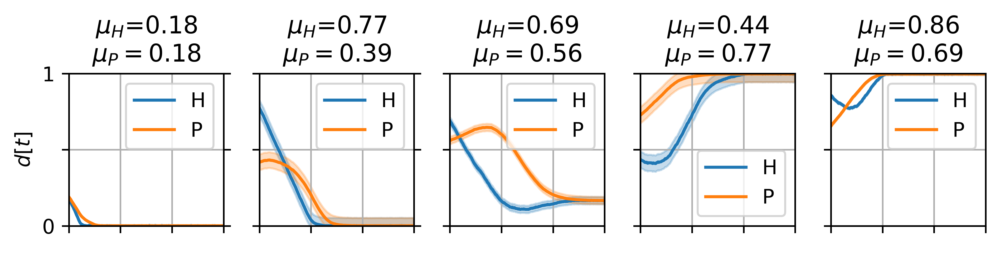

In [254]:
dpi = 550
fig,axs = plt.subplots(1,len(regions),figsize=(7, 2),dpi=dpi,sharey=True)

# Add data to image grid
k = 0
for ax in axs:

    i_hub,j_per = regions[k]
    result_filename = f'{i_hub}_{j_per}.pickle'
    result_path = results_path + '/' + result_filename

    with open(result_path, 'rb') as h:
        result = pickle.load(h)

    # Hub
    dataH = np.mean(result['node_development'][:,:,0],axis=(0))
    H_std = np.var(dataH, axis=0)

    ax.plot(dataH,c='tab:blue',label='H')
    ax.fill_between(np.arange(T), dataH - H_std, dataH + H_std, alpha=0.25, edgecolor='none',color='tab:blue')

    # Periph
    dataP = np.mean(result['node_development'][:,:,1:],axis=(0,2))
    P_std = np.var(dataH, axis=0)

    ax.plot(dataP,c='tab:orange',label='P')
    ax.fill_between(np.arange(T), dataP - P_std, dataP + P_std, alpha=0.25, edgecolor='none',color='tab:orange')

    # Top row: Development
    ax.set_title('$\mu_{H}$='+f'{round(development_hub[i_hub],2)}'+'\n$ \mu_{P}=$'+f'{round(development_means[j_per],2)}')

    ax.set_xlim([0,T])
    ax.set_ylim([0,1])

    # Tiks and colorbar
    if k<2:
        ax.tick_params(left=True, bottom=True,right=True)
    else:
        ax.tick_params(left=True, bottom=True,right=False)
    
    # Axis labels
    if k==0:
        ax.set_ylabel('$d[t]$')
    
    # Axis ticks rotation
    ax.tick_params(axis='x', labelrotation=0)
    ax.tick_params(axis='y', labelrotation=0)

    ax.set_xticks([0,100,200,300])
    ax.tick_params(bottom=True)
    ax.tick_params(labelbottom=False)
    ax.set_xlabel(' ')
    ax.set_yticks([0,0.5,1],['0','','1'])
   
    ax.legend()
    ax.grid()

    # Update counter
    k += 1

plt.tight_layout()
plt.savefig('./EXP1/RESULT_PLOT2_PERIPH_HUB_T.jpg', dpi=dpi)


### PLOT 3. Same but one all runs exact values hub and periph

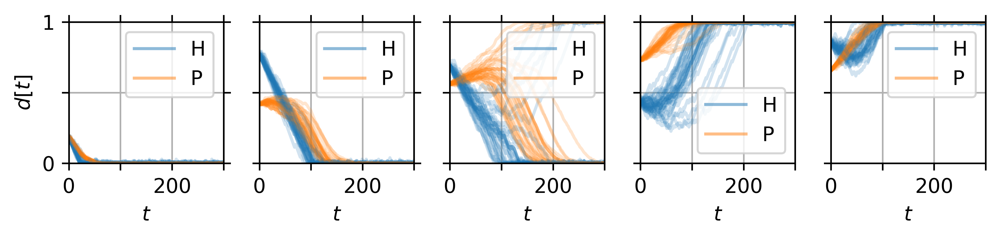

In [252]:
dpi = 550
fig,axs = plt.subplots(1,len(regions),figsize=(7, 1.75),dpi=dpi,sharey=True)

k = 0
for ax in axs:

    i_hub,j_per = regions[k]
    result_filename = f'{i_hub}_{j_per}.pickle'
    result_path = results_path + '/' + result_filename

    with open(result_path, 'rb') as h:
        result = pickle.load(h)

    # Plot all runs!
    for r in range(R):
        dataH = result['node_development'][r,:,0]
        dataP = np.mean(result['node_development'][r,:,1:],axis=1)
        
        if r==0:
            ax.plot(dataH,c='tab:blue',label='H',alpha=0.5)
            ax.plot(dataP,c='tab:orange',label='P',alpha=0.5)
        else:
            ax.plot(dataH,c='tab:blue',alpha=0.2)
            ax.plot(dataP,c='tab:orange',alpha=0.2)

    ax.set_xlim([0,T])
    ax.set_ylim([0,1])

    # Tiks and colorbar
    if k<2:
        ax.tick_params(left=True, bottom=True,right=True)
    else:
        ax.tick_params(left=True, bottom=True,right=False)
    
    # Axis labels
    if k==0:
        ax.set_ylabel('$d[t]$')
    
    ax.set_xticks([0,100,200,300],['0','','200',''])
    ax.tick_params(bottom=True,top=True)
    ax.tick_params(labelbottom=True)
    ax.set_xlabel('$t$')
    ax.set_yticks([0,0.5,1],['0','','1'])
    
    # Axis ticks rotation
    ax.tick_params(axis='x', labelrotation=0)
    ax.tick_params(axis='y', labelrotation=0)

    ax.legend()
    ax.grid()

    # Update counter
    k += 1

plt.tight_layout()
plt.savefig('./EXP1/RESULT_PLOT3_PERIPH_HUB_T.jpg', dpi=dpi)

### PLOT 4: Phase space of each region

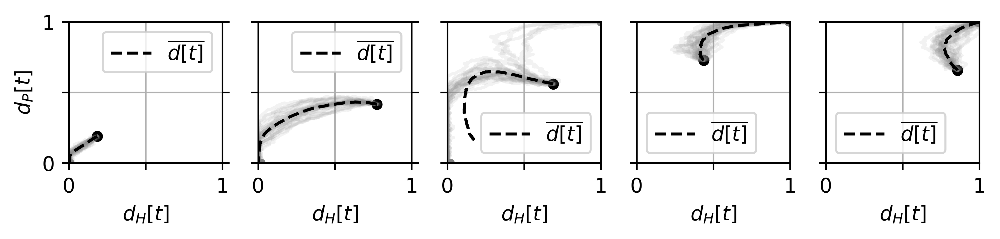

In [253]:
# PHASE SPACE OF EACH REGION
dpi = 550
fig,axs = plt.subplots(1,len(regions),figsize=(7, 1.75),dpi=dpi,sharey=True)

# Specific limits
xlims = [[0,0.2],[0,0.6],[0,1],[0.3,1],[0.6,1]]
ylims = [[0,0.2],[0,0.5],[0,1],[0.6,1],[0.6,1]]

# Add data to image grid
k = 0
for ax in axs:

    i_hub,j_per = regions[k]
    result_filename = f'{i_hub}_{j_per}.pickle'
    result_path = results_path + '/' + result_filename

    with open(result_path, 'rb') as h:
        result = pickle.load(h)

    # Plot all runs!
    for r in range(R):
        dataH = result['node_development'][r,:,0]
        dataP = np.mean(result['node_development'][r,:,1:],axis=1)
        
        ax.plot(dataH,dataP,alpha=0.1,c='grey')
        ax.scatter(dataH[-1],dataP[-1],c='grey',s=10)

    # Periph
    dataH = np.mean(result['node_development'][:,:,0],axis=(0))
    dataP = np.mean(result['node_development'][:,:,1:],axis=(0,2))

    ax.plot(dataH,dataP,c='black',ls='--',label='$\overline{d[t]}$')
    ax.scatter(dataH[0],dataP[0],c='black',s=20)
    ax.set_xlim([0,1])
    ax.set_ylim([0,1])

    # Tiks and colorbar
    if k<2:
        ax.tick_params(left=True, bottom=True,right=True)
    else:
        ax.tick_params(left=True, bottom=True,right=False)
    
    # Axis labels
    if k==0:
        ax.set_ylabel('$d_P[t]$')
    
    ax.set_xticks([0,0.5,1],['0','','1'])
    ax.set_yticks([0,0.5,1],['0','','1'])
    ax.set_xlabel('$d_H[t]$')
    ax.set_yticks([0,0.5,1],['0','','1'])
    
    # Axis ticks rotation
    ax.tick_params(axis='x', labelrotation=0)
    ax.tick_params(axis='y', labelrotation=0)

    ax.legend()
    ax.grid()

    # Update counter
    k += 1

plt.tight_layout()
plt.savefig('./EXP1/RESULT_PLOT3_PERIPH_HUB_PHASE.jpg', dpi=dpi)

___

In [6]:
# LOADING DATA
realization_folder_name = '4'
experiment_root_folder = 'EXP1'

realization_path = f"./{experiment_root_folder}/{realization_folder_name}"
results_path = realization_path +'/' + 'results'

In [11]:
# Loop load all values
metric_H = np.zeros((x1_size,x2_size))
metric_P = np.zeros((x1_size,x2_size))
metric_S = np.zeros((x1_size,x2_size))
metric_S_V = np.zeros((x1_size,x2_size))

for i_hub in range(x1_size):
    for j_per in range(x2_size):
        
        result_filename = f'{i_hub}_{j_per}.pickle'
        result_path = results_path + '/' + result_filename

        with open(result_path, 'rb') as h:
                    result = pickle.load(h)

        #print(result_filename)
        metric_H[i_hub,j_per] = np.mean(result['node_development'][:,T-1,0],axis=(0))
        metric_P[i_hub,j_per] = np.mean(result['node_development'][:,T-1,1:],axis=(0,1))
        metric_S[i_hub,j_per] = np.mean(result['node_development'][:,T-1,:],axis=(0,1))
        metric_S_V[i_hub,j_per] = np.var(result['node_development'][:,T-1,:],axis=(0,1))
        

In [275]:
T

300

### Phase plot

/tmp/ipykernel_315/146103847.py:105: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


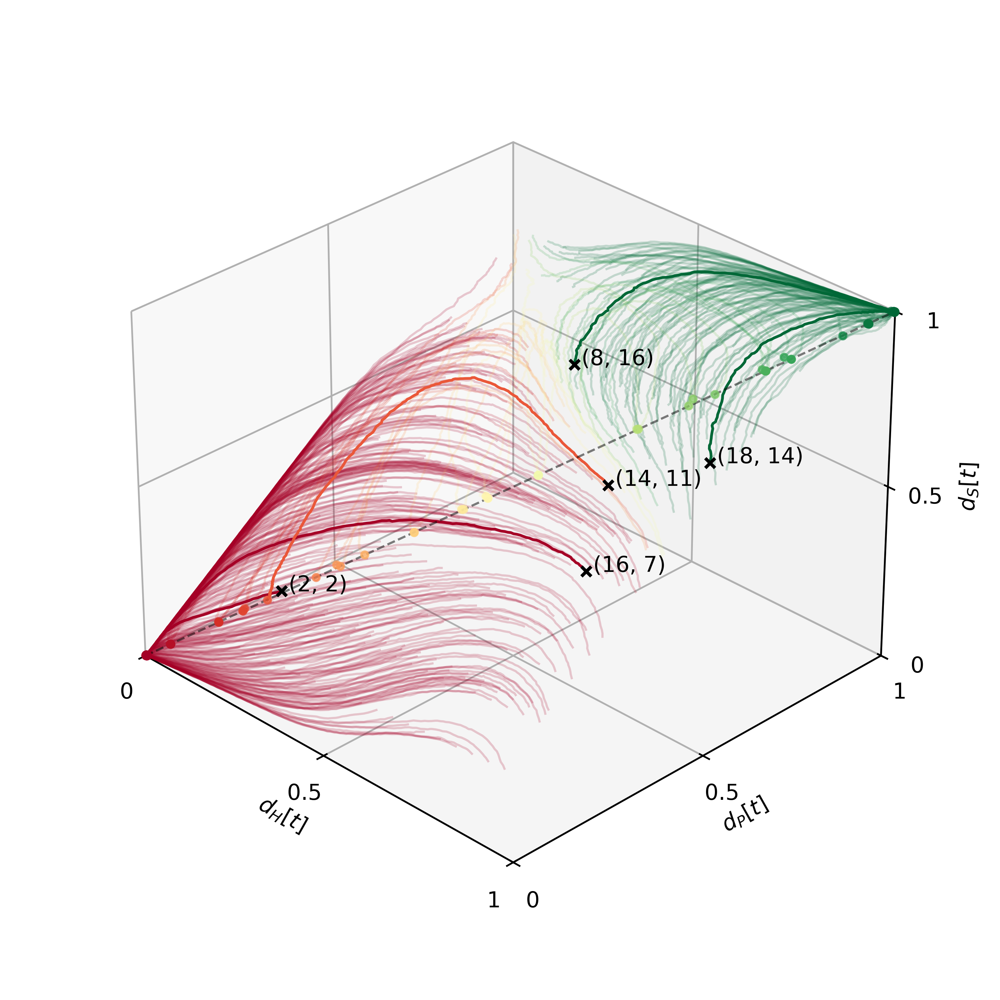

In [624]:
# 3D PLOT OF ALL RESULTS
# Each plot is done with color of last m according to metric_S

dpi = 550
fig = plt.figure(figsize=(8,8),dpi=dpi)
ax = fig.add_subplot(111, projection='3d')
t_max = T-1 #T-50

# Phase plot of all values
for i_hub in range(x1_size):
    for j_per in range(x2_size):
        
        result_filename = f'{i_hub}_{j_per}.pickle'
        result_path = results_path + '/' + result_filename

        with open(result_path, 'rb') as h:
                    result = pickle.load(h)

        # Do phase plot of all values
        x = np.mean(result['node_development'][:,:t_max,0],axis=0) 
        y = np.mean(result['node_development'][:,:t_max,1:],axis=(0,2))
        z = np.mean(result['node_development'][:,:t_max,:],axis=(0,2))

        c = [metric_S[i_hub,j_per]]
        #p = ax.plot(x,y,z,alpha=0.5,lw=1,c=plt.cm.RdYlGn(c))   
        p = ax.plot(x,y,z,alpha=0.2,lw=1,c=plt.cm.RdYlGn(c))   

        # Last value
        scat = ax.scatter(x[-1],y[-1],z[-1],c=plt.cm.RdYlGn(c),s=10,alpha=0.75)           


for i_hub, j_per in regions:

    # Retrieve data
    result_path = results_path + '/' + f'{i_hub}_{j_per}.pickle'
    with open(result_path, 'rb') as h:
                result = pickle.load(h)

    x = np.mean(result['node_development'][:,:t_max,0],axis=0) 
    y = np.mean(result['node_development'][:,:t_max,1:],axis=(0,2))
    z = np.mean(result['node_development'][:,:t_max,:],axis=(0,2))
    c = [metric_S[i_hub,j_per]]
    p = ax.plot(x,y,z,alpha=1,lw=1.25,c=plt.cm.RdYlGn(c))       

    # Scatter of final value
    scat = ax.scatter(x[0],y[0],z[0],c='black',marker='x')       

    ax.text(x[0],y[0],z[0],f' {i_hub, j_per}', (1, 1, 0), color='black', zorder=10)

ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.set_zlim(0, 1)

ax.set_xticks([0,0.5,1],['0','0.5','1'])
ax.set_yticks([0,0.5,1],['0','0.5','1'])
ax.set_zticks([0,0.5,1],['0','0.5','1'])


# Change plot angle
# https://matplotlib.org/stable/api/toolkits/mplot3d/view_angles.html
angle_a = 30
angle_b = -45
ax.view_init(angle_a, angle_b)

# Set labels and title
ax.set_xlabel('$d_H[t]$')
ax.set_ylabel('$d_P[t]$')
ax.set_zlabel('$d_S[t]$')

# Do reference line x=y=z
x = np.linspace(0,1,100)
p = ax.plot(x,x,x,alpha=0.5,lw=1,c='black',ls='--')   

ax.set_box_aspect(None, zoom=0.85)

plt.tight_layout()
plt.savefig(f'./EXP1/RESULT_PHASEPLOT_FINAL.jpg', dpi=dpi)

/tmp/ipykernel_9622/2647843272.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


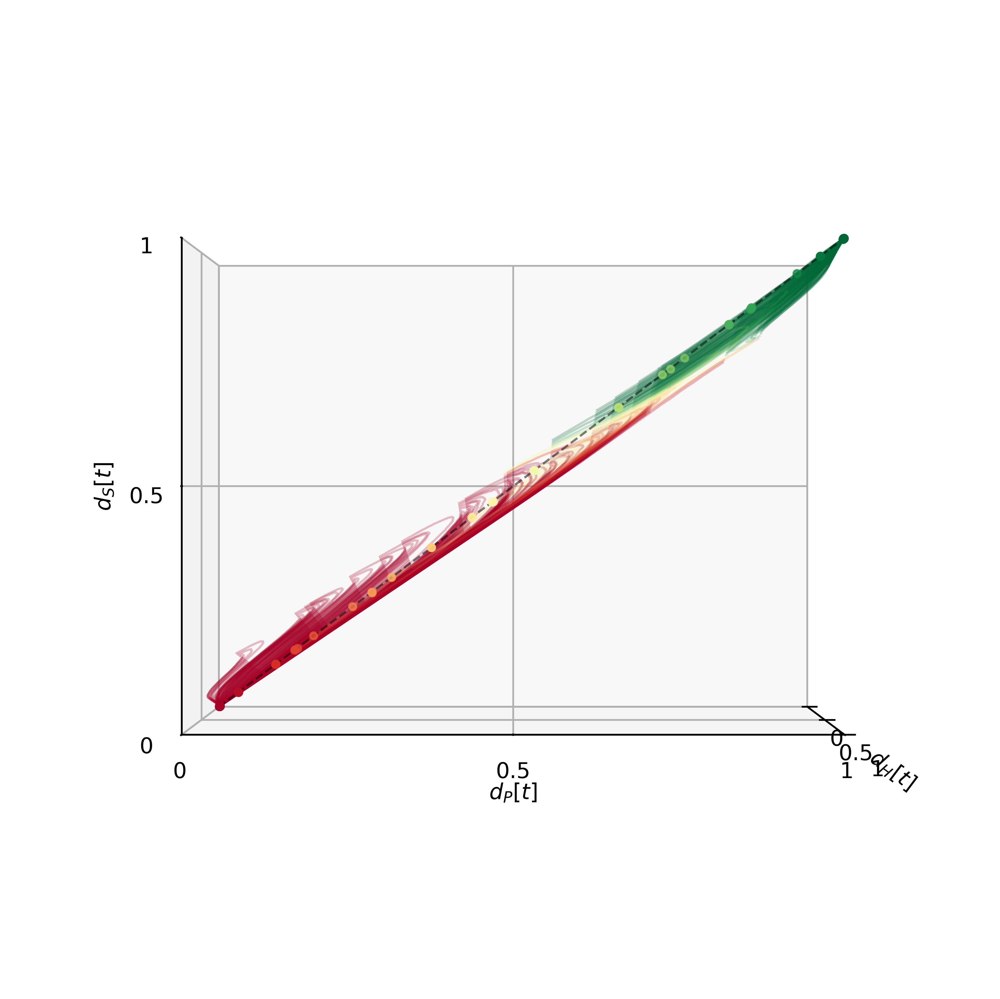

/tmp/ipykernel_9622/2647843272.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


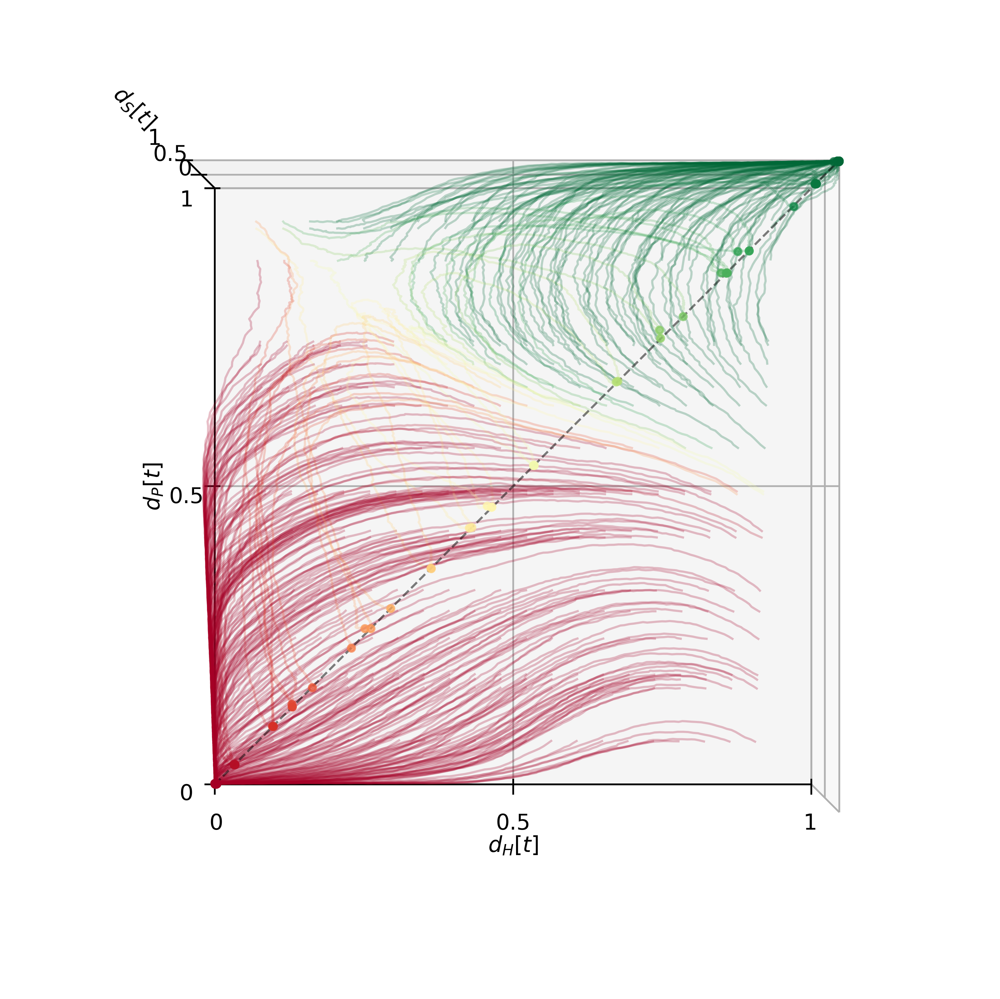

/tmp/ipykernel_9622/2647843272.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


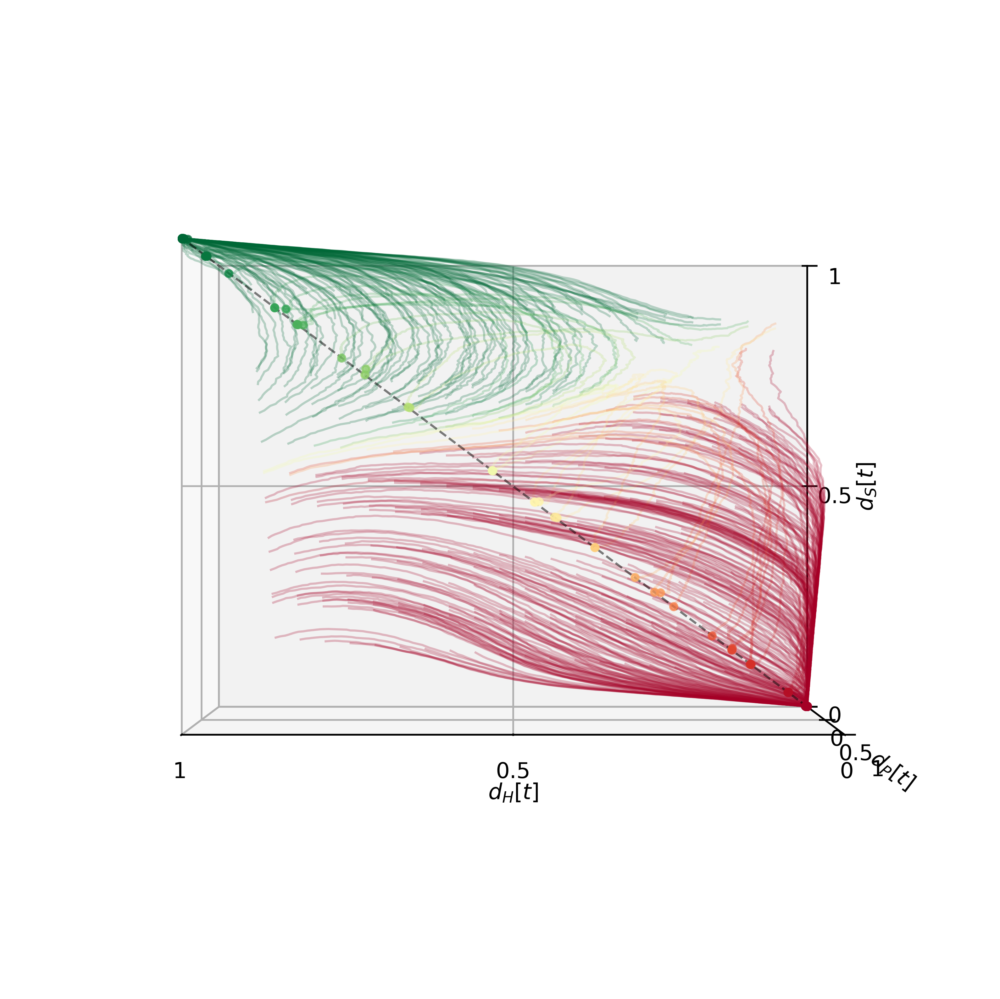

/tmp/ipykernel_9622/2647843272.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


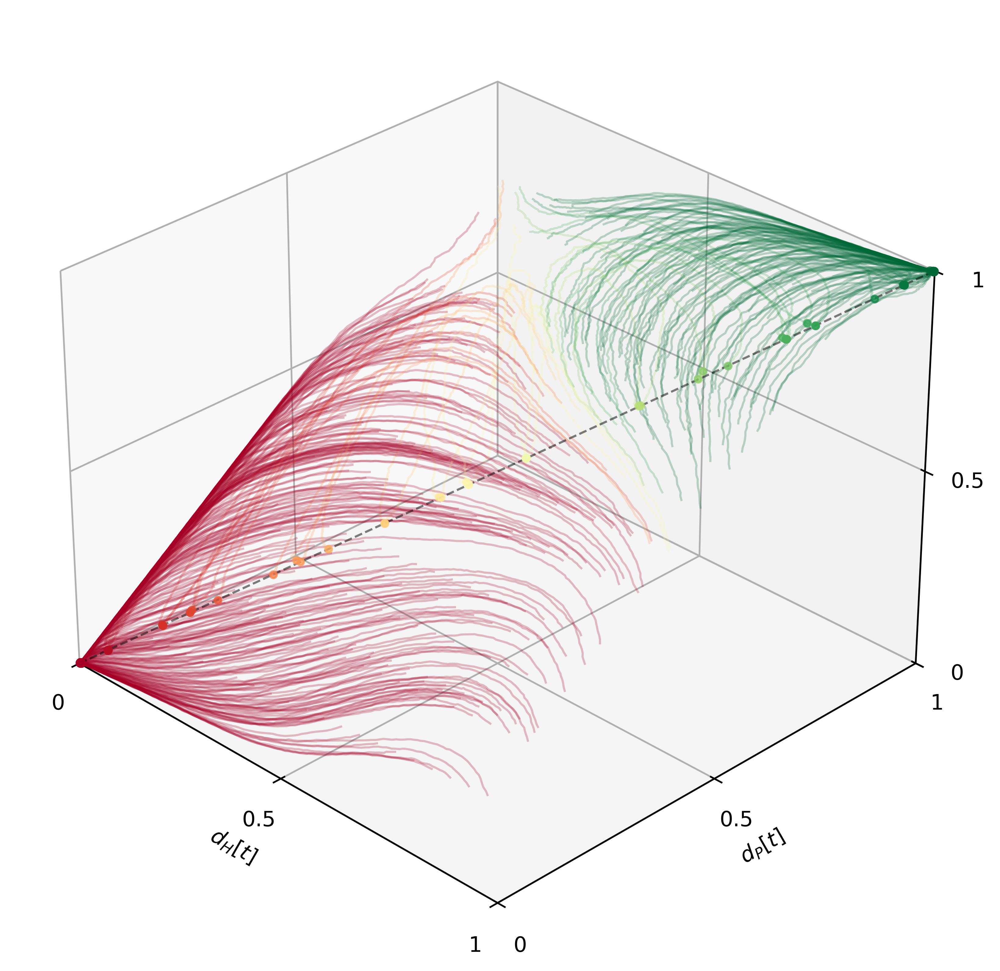

In [274]:
dpi = 500
selected_angles = [(0,0),(90,-90),(0,90),(30,-45)] 

for angle_a,angle_b  in selected_angles:

    fig = plt.figure(figsize=(8,8),dpi=dpi)
    ax = fig.add_subplot(111, projection='3d')

    t_max = T-1

    # Phase plot of all values
    for i_hub in range(x1_size):
        for j_per in range(x2_size):
            
            result_filename = f'{i_hub}_{j_per}.pickle'
            result_path = results_path + '/' + result_filename

            with open(result_path, 'rb') as h:
                        result = pickle.load(h)

            # Do phase plot of all values
            x = np.mean(result['node_development'][:,:t_max,0],axis=0) 
            y = np.mean(result['node_development'][:,:t_max,1:],axis=(0,2))
            z = np.mean(result['node_development'][:,:t_max,:],axis=(0,2))

            c = [metric_S[i_hub,j_per]]
            p = ax.plot(x,y,z,alpha=0.25,lw=1,c=plt.cm.RdYlGn(c))   

            # Last value
            scat = ax.scatter(x[-1],y[-1],z[-1],c=plt.cm.RdYlGn(c),s=10,alpha=0.75)           

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.set_zlim(0, 1)

    ax.set_xticks([0,0.5,1],['0','0.5','1'])
    ax.set_yticks([0,0.5,1],['0','0.5','1'])
    ax.set_zticks([0,0.5,1],['0','0.5','1'])

    # Change plot angle
    # https://matplotlib.org/stable/api/toolkits/mplot3d/view_angles.html
    ax.view_init(angle_a, angle_b)

    # Set labels and title
    ax.set_xlabel('$d_H[t]$')
    ax.set_ylabel('$d_P[t]$')
    ax.set_zlabel('$d_S[t]$')

    # Do reference line x=y=z
    x = np.linspace(0,1,100)
    p = ax.plot(x,x,x,alpha=0.5,lw=1,c='black',ls='--')   

    plt.tight_layout()
    fig.subplots_adjust(left=-0.11)  # plot outside the normal area
    plt.savefig(f'./EXP1/RESULT_PHASEPLOT_{angle_a}_{angle_b}.jpg', dpi=dpi)
    plt.show()

___